In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install dash
!pip install pyngrok

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 15.9 MB/s eta 0:00:00
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  Attempting uninstall: Flask
    Found existing installation: Flask 3.1.0
    Uninstalling Flask-3.1.0:
      Successfully uninstalled Flask-3.1.0


In [ ]:
from dash import Dash, html, dcc, Input, Output
from dash.dependencies import Input, Output
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score

import plotly.express as px
from pyngrok import ngrok

# Load dataset
data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data_by_year.csv')
artist_data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data_by_artist.csv')


print(data.head())


   valence  year  acousticness  \
0   0.0594  1921         0.982   
1   0.9630  1921         0.732   
2   0.0394  1921         0.961   
3   0.1650  1921         0.967   
4   0.2530  1921         0.957   

                                             artists  danceability  \
0  ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                     ['Dennis Day']         0.819   
2  ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                   ['Frank Parker']         0.275   
4                                     ['Phil Regan']         0.418   

   duration_ms  energy  explicit                      id  instrumentalness  \
0       831667   0.211         0  4BJqT0PrAfrxzMOxytFOIz          0.878000   
1       180533   0.341         0  7xPhfUan2yNtyFG0cUWkt8          0.000000   
2       500062   0.166         0  1o6I8BglA6ylDMrIELygv1          0.913000   
3       210000   0.309         0  3ftBPsC5vPBKxYSee08FDH      

In [ ]:
print(data)

        valence  year  acousticness  \
0        0.0594  1921       0.98200   
1        0.9630  1921       0.73200   
2        0.0394  1921       0.96100   
3        0.1650  1921       0.96700   
4        0.2530  1921       0.95700   
...         ...   ...           ...   
170648   0.6080  2020       0.08460   
170649   0.7340  2020       0.20600   
170650   0.6370  2020       0.10100   
170651   0.1950  2020       0.00998   
170652   0.6420  2020       0.13200   

                                                  artists  danceability  \
0       ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                          ['Dennis Day']         0.819   
2       ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                        ['Frank Parker']         0.275   
4                                          ['Phil Regan']         0.418   
...                                                   ...           ...   
170648

In [ ]:
print(data.isnull().sum())

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64


In [ ]:
unique_artists = data.drop_duplicates(subset='artists')
unique_artists.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [ ]:
data.shape
unique_artists.shape

(34088, 19)

In [ ]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
valence,170653.0,0.528587,0.263171,0.0,0.3170,0.540000,0.7470,1.000
year,170653.0,1976.787241,25.917853,1921.0,1956.0000,1977.000000,1999.0000,2020.000
acousticness,170653.0,0.502115,0.376032,0.0,0.1020,0.516000,0.8930,0.996
danceability,170653.0,0.537396,0.176138,0.0,0.4150,0.548000,0.6680,0.988
duration_ms,170653.0,230948.310666,126118.414668,5108.0,169827.0000,207467.000000,262400.0000,5403500.000
energy,170653.0,0.482389,0.267646,0.0,0.2550,0.471000,0.7030,1.000
explicit,170653.0,0.084575,0.278249,0.0,0.0000,0.000000,0.0000,1.000
instrumentalness,170653.0,0.167010,0.313475,0.0,0.0000,0.000216,0.1020,1.000
key,170653.0,5.199844,3.515094,0.0,2.0000,5.000000,8.0000,11.000
liveness,170653.0,0.205839,0.174805,0.0,0.0988,0.136000,0.2610,1.000


In [ ]:
from sklearn.preprocessing import StandardScaler

# Define the features to normalize
features_to_normalize = ['tempo', 'loudness', 'energy']

# Initialize the StandardScaler
scaler = StandardScaler()

# Normalize the selected features using Z-score normalization
data[features_to_normalize] = scaler.fit_transform(data[features_to_normalize])

# Print the summary statistics of the normalized features
print(data[features_to_normalize].describe())

data.update(features_to_normalize)




              tempo      loudness        energy
count  1.706530e+05  1.706530e+05  1.706530e+05
mean  -8.060865e-17  1.305727e-16 -3.810591e-16
std    1.000003e+00  1.000003e+00  1.000003e+00
min   -3.805520e+00 -8.517487e+00 -1.802346e+00
25%   -7.633272e-01 -5.523080e-01 -8.495914e-01
50%   -6.944636e-02  1.558444e-01 -4.255203e-02
75%    6.081523e-01  7.520262e-01  8.242681e-01
max    4.124123e+00  2.689222e+00  1.933947e+00


In [ ]:
data['release_date'] = pd.to_datetime(data['release_date'], errors='coerce')
data['year'] = data['release_date'].dt.year

In [ ]:
categorical_data = data.select_dtypes(include = 'object')

categorical_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   artists  170653 non-null  object
 1   id       170653 non-null  object
 2   name     170653 non-null  object
dtypes: object(3)
memory usage: 3.9+ MB


In [ ]:
# Drop irrelevant columns
data.drop(columns=['id', 'release_date', 'mode'], inplace=True)

In [ ]:
numerical_features = ['danceability', 'energy', 'loudness', 'tempo', 'valence']
print(data[numerical_features].max())

danceability    0.988000
energy          1.933947
loudness        2.689222
tempo           4.124123
valence         1.000000
dtype: float64


In [ ]:
# Compute the correlation matrix for the normalized features
correlation_matrix = data[numerical_features].corr()

# Print the correlation matrix
print(correlation_matrix)


              danceability    energy  loudness     tempo   valence
danceability      1.000000  0.221967  0.285057  0.001801  0.558946
energy            0.221967  1.000000  0.782362  0.250865  0.353876
loudness          0.285057  0.782362  1.000000  0.209774  0.313512
tempo             0.001801  0.250865  0.209774  1.000000  0.171689
valence           0.558946  0.353876  0.313512  0.171689  1.000000


In [ ]:
import plotly.express as px

# Create an interactive 3D scatter plot
fig = px.scatter_3d(data,
                     x='tempo',
                     y='loudness',
                     z='energy',
                     color='energy',
                     opacity=0.8)

# Show the plot
fig.show()


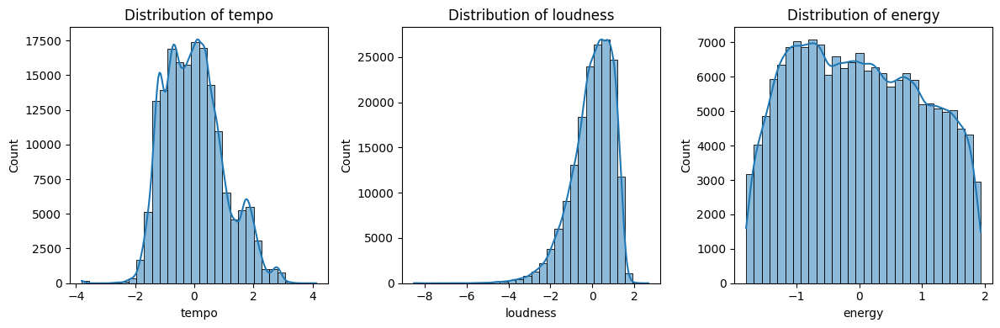

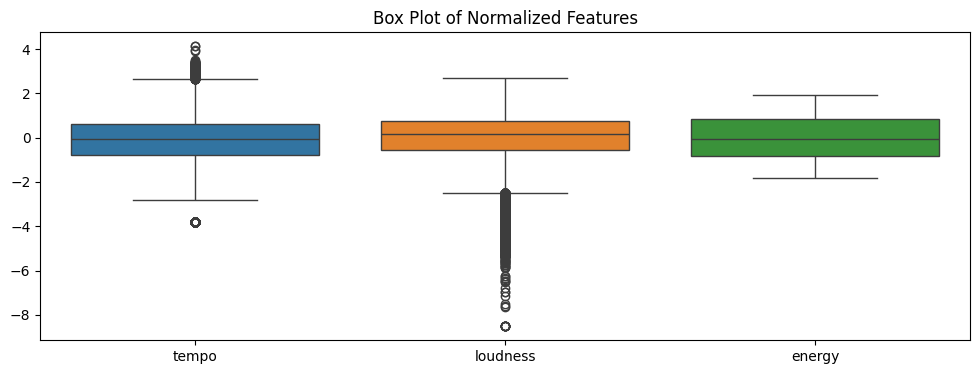

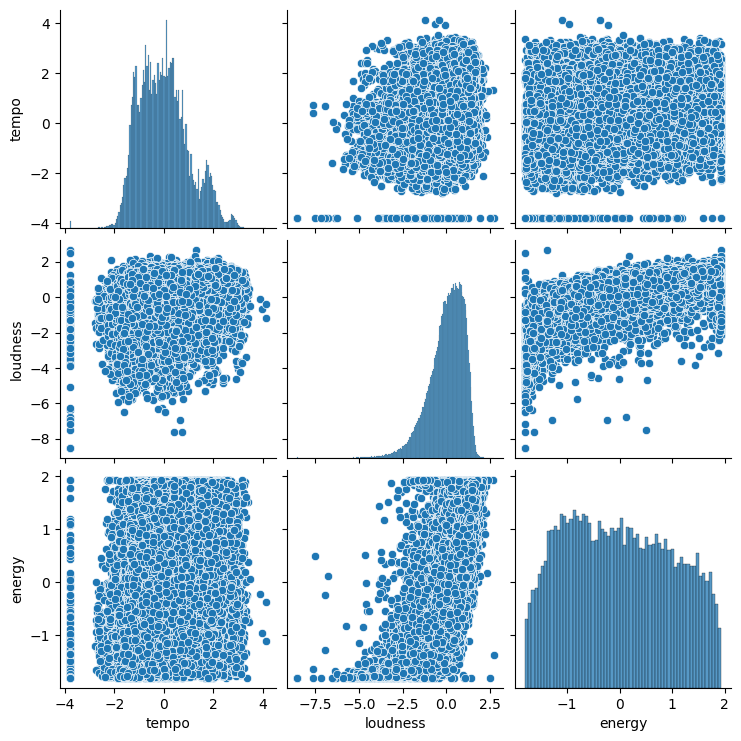

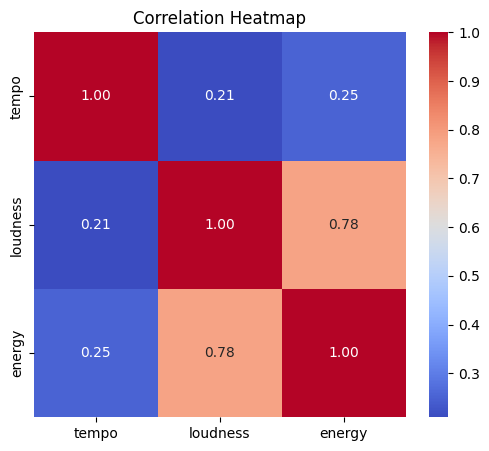

In [ ]:

# print(data[features_to_normalize].describe())

plt.figure(figsize=(12, 4))
for i, feature in enumerate(features_to_normalize):
    plt.subplot(1, len(features_to_normalize), i + 1)
    sns.histplot(data[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 4))
sns.boxplot(data=data[features_to_normalize])
plt.title("Box Plot of Normalized Features")
plt.show()

sns.pairplot(data[features_to_normalize])
plt.show()

plt.figure(figsize=(6, 5))
sns.heatmap(data[features_to_normalize].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


In [ ]:
print(data[features_to_normalize])

           tempo  loudness    energy
0      -1.169307 -1.514237 -1.013988
1      -1.821180 -0.170766 -0.528270
2      -0.212404 -0.593551 -1.182122
3      -0.545537  0.377680 -0.647832
4      -0.494867  0.240788 -1.081242
...          ...       ...       ...
170648 -0.385320  1.362950  1.216579
170649  0.686274  0.956136  1.011083
170650 -0.819761  1.621992  1.403394
170651 -1.361404  0.755887  0.525365
170652 -0.712201  1.147784  0.891521

[170653 rows x 3 columns]


In [ ]:
data.update(features_to_normalize)
print(data)

        valence    year  acousticness  \
0        0.0594  1921.0       0.98200   
1        0.9630  1921.0       0.73200   
2        0.0394  1921.0       0.96100   
3        0.1650  1921.0       0.96700   
4        0.2530  1921.0       0.95700   
...         ...     ...           ...   
170648   0.6080     NaN       0.08460   
170649   0.7340     NaN       0.20600   
170650   0.6370     NaN       0.10100   
170651   0.1950     NaN       0.00998   
170652   0.6420     NaN       0.13200   

                                                  artists  danceability  \
0       ['Sergei Rachmaninoff', 'James Levine', 'Berli...         0.279   
1                                          ['Dennis Day']         0.819   
2       ['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...         0.328   
3                                        ['Frank Parker']         0.275   
4                                          ['Phil Regan']         0.418   
...                                                   ...

In [ ]:
high_danceability = unique_artists.query("0.5 <= danceability <= 1")
# print(high_danceability)

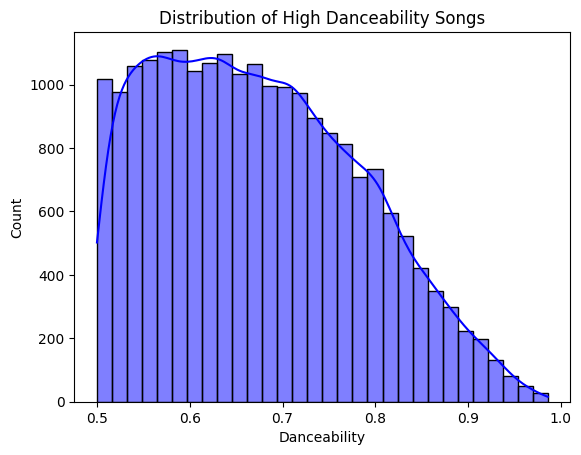

In [ ]:
sns.histplot(high_danceability['danceability'], kde=True, bins=30, color='blue')
plt.title('Distribution of High Danceability Songs')
plt.xlabel('Danceability')
plt.ylabel('Count')
plt.show()


In [ ]:
#  data.drop(['cluster'], axis=1)

In [ ]:
# clusters.shape

In [ ]:
data['is_popular'] = (data['popularity'] > 60).astype(int)
y = data['is_popular']
# print(data)

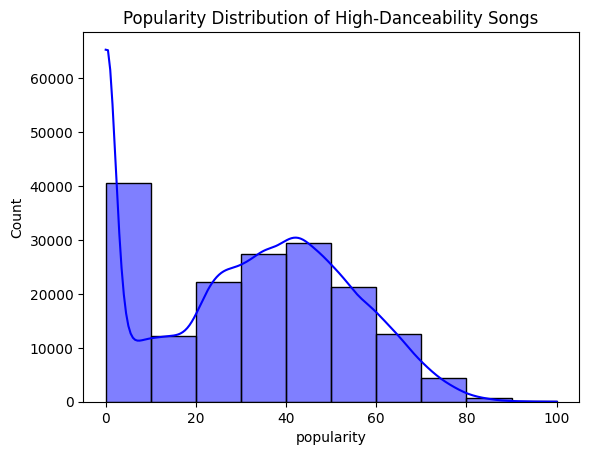

In [ ]:
sns.histplot(data=data, x="popularity", kde=True, color="blue", bins=10)
plt.title("Popularity Distribution of High-Danceability Songs")
plt.show()

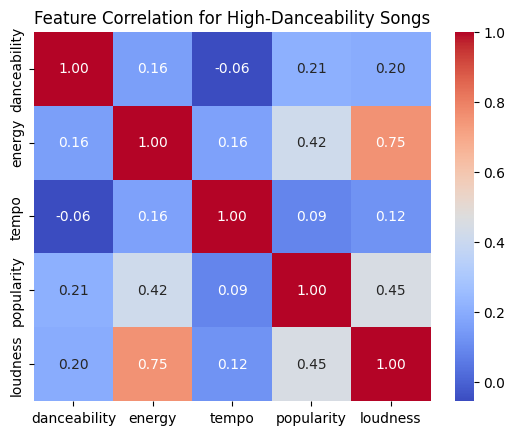

In [ ]:
dance_corr_matrix = high_danceability[["danceability", "energy", "tempo", "popularity", "loudness"]].corr()
sns.heatmap(dance_corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation for High-Danceability Songs")
plt.show()

In [ ]:
Q1 = data['duration_ms'].quantile(0.25)
Q3 = data['duration_ms'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['duration_ms'] < lower_bound) | (data['duration_ms'] > upper_bound)]
print("Number of outliers:", len(outliers))


Number of outliers: 9518


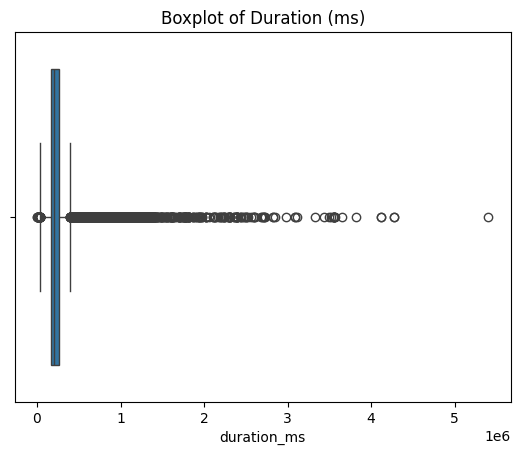

In [ ]:
sns.boxplot(x=data['duration_ms'])
plt.title("Boxplot of Duration (ms)")
plt.show()

<ipython-input-39-5148c042d809>:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




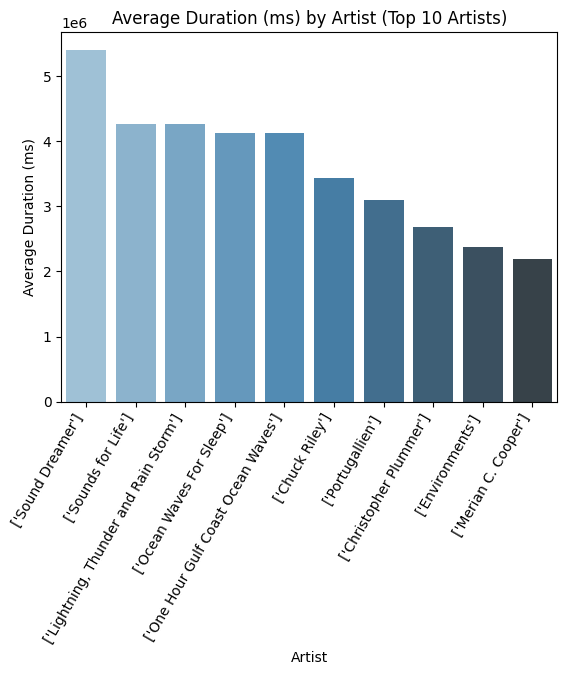

In [ ]:
avg_duration_by_artist = data.groupby('artists')['duration_ms'].mean().reset_index()
top_10_artists = avg_duration_by_artist.nlargest(10, 'duration_ms')

sns.barplot(data=top_10_artists, x='artists', y='duration_ms', palette='Blues_d')
plt.title("Average Duration (ms) by Artist (Top 10 Artists)")
plt.xlabel("Artist")
plt.ylabel("Average Duration (ms)")
plt.xticks(rotation=60, ha="right")
plt.show()


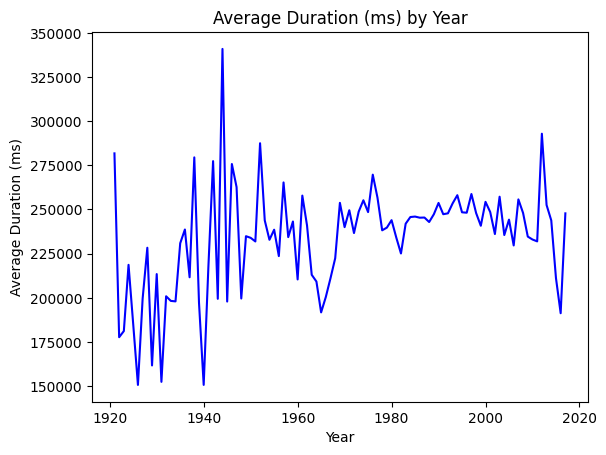

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

avg_duration_by_year = data.groupby('year')['duration_ms'].mean().reset_index()

sns.lineplot(data=avg_duration_by_year, x='year', y='duration_ms', color='blue')
plt.title("Average Duration (ms) by Year")
plt.xlabel("Year")
plt.ylabel("Average Duration (ms)")
plt.show()


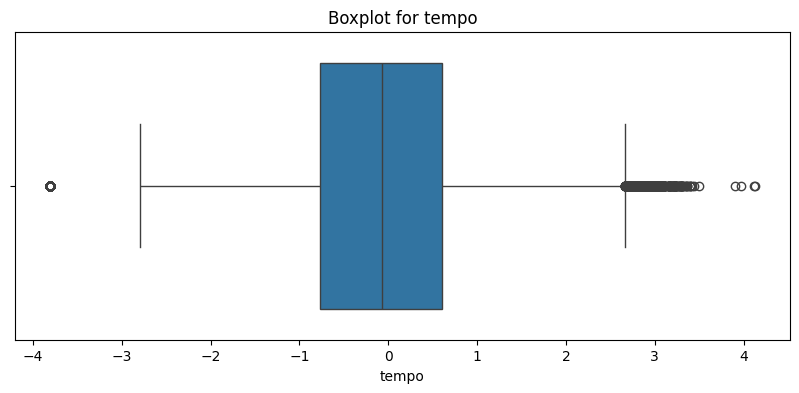

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_cols = data[features_to_normalize].select_dtypes(include=['float64', 'int64']).columns

for col in numeric_cols[:1]:
    plt.figure(figsize=(10, 4))
    sns.boxplot(x=data[col])
    plt.title(f"Boxplot for {col}")
    plt.show()

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5, random_state=42)
features = data[features_to_normalize]
data['cluster'] = kmeans.fit_predict(features)


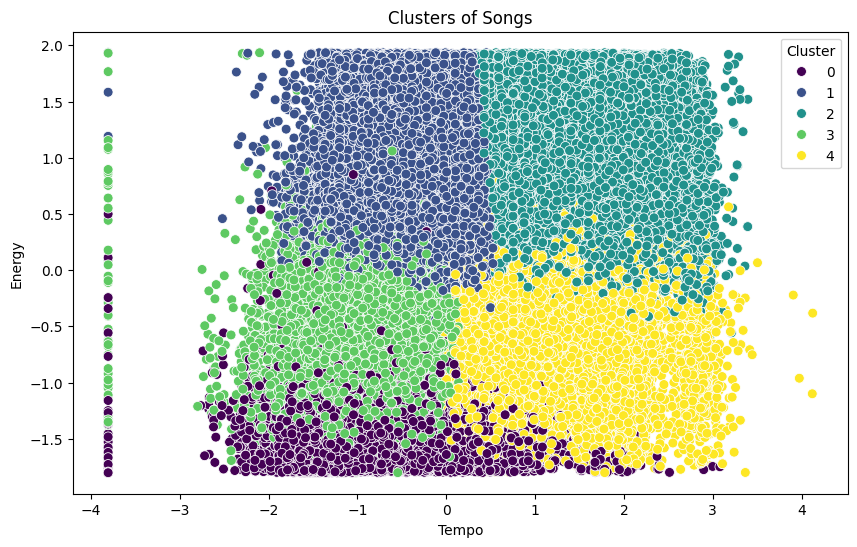

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=data['tempo'],
    y=data['energy'],
    hue=data['cluster'],
    palette='viridis',
    s=50
)
plt.title('Clusters of Songs')
plt.xlabel('Tempo')
plt.ylabel('Energy')
plt.legend(title='Cluster')
plt.show()

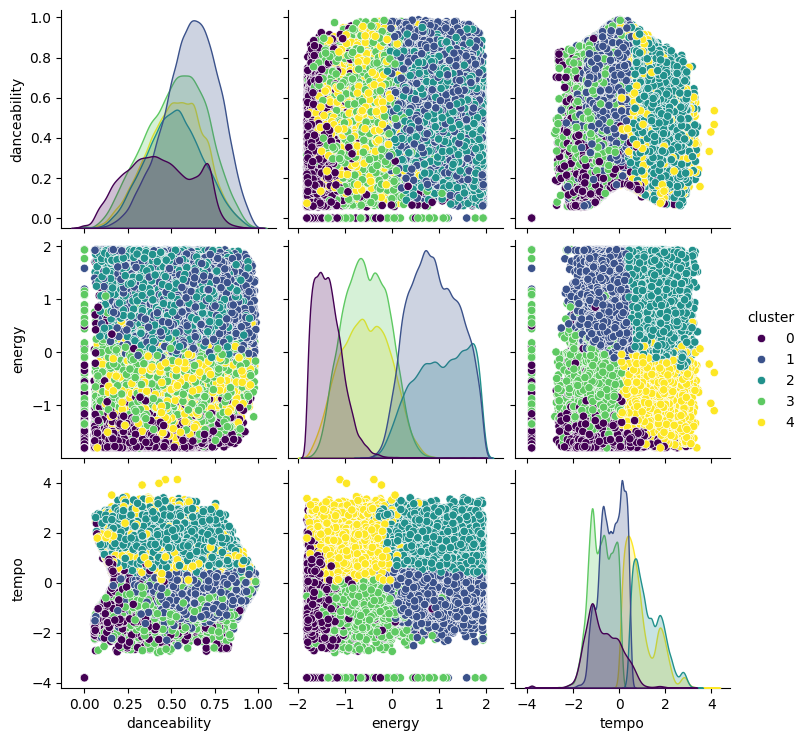

In [ ]:
sns.pairplot(data[['danceability', 'energy', 'tempo', 'cluster']], hue='cluster', palette='viridis')
plt.show()

In [ ]:
import plotly.express as px

# Create a scatter plot with 'energy' on the x-axis, 'popularity' on the y-axis,
# and color the points based on 'duration_ms'.
fig = px.scatter(
    genre_data,
    x='energy',
    y='popularity',
    color='duration_ms',  # Color based on duration
    trendline='ols',      # Add a trendline (requires statsmodels)
    title='Popularity vs Energy (Colored by Duration)',
    color_continuous_scale='viridis',  # Correct argument
)

# Show the plot
fig.show()


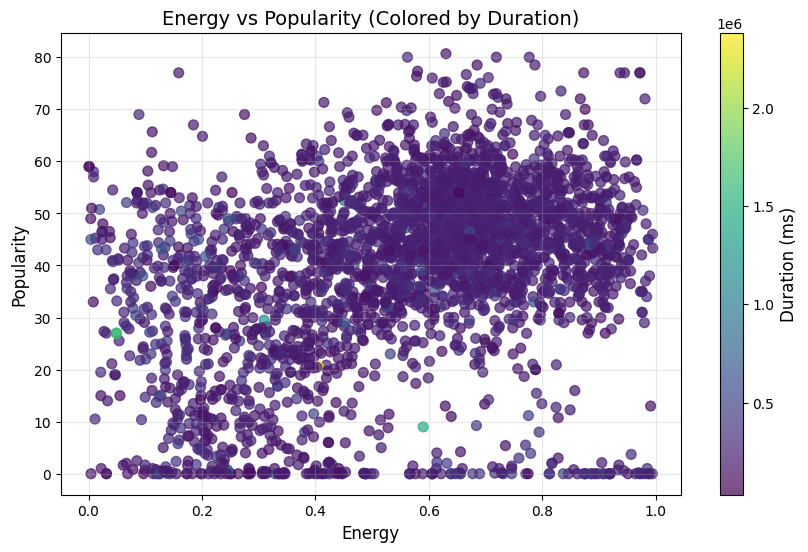

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Normalize the 'duration_ms' column for better colormap scaling
norm = plt.Normalize(genre_data['duration_ms'].min(), genre_data['duration_ms'].max())
cmap = plt.cm.viridis

plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    genre_data['energy'],
    genre_data['popularity'],
    c=genre_data['duration_ms'],
    cmap=cmap,
    s=50,
    alpha=0.7
)

# Add a colorbar to indicate the mapping of colors to values
cbar = plt.colorbar(scatter)
cbar.set_label('Duration (ms)', fontsize=12)

# Add labels and title
plt.xlabel('Energy', fontsize=12)
plt.ylabel('Popularity', fontsize=12)
plt.title('Energy vs Popularity (Colored by Duration)', fontsize=14)
plt.grid(alpha=0.3)

# Show the plot
plt.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Normalize duration_ms to minutes for better visualization
genre_data['duration_min'] = genre_data['duration_ms'] / 60000

# Select relevant columns for the plot
features = ['genres', 'acousticness', 'danceability', 'duration_min', 'energy',
            'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence', 'popularity']

# Filter the dataset to include only the selected features
data_filtered = genre_data[features]

# Create the parallel coordinates plot
fig = px.parallel_coordinates(
    data_filtered,
    color='popularity',  # Color by popularity
    dimensions=['acousticness', 'danceability', 'duration_min', 'energy',
                'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence'],
    title='Audio Features vs Popularity Across Genres',
    color_continuous_scale=px.colors.sequential.Viridis,
    labels={
        'acousticness': 'Acousticness',
        'danceability': 'Danceability',
        'duration_min': 'Duration (min)',
        'energy': 'Energy',
        'instrumentalness': 'Instrumentalness',
        'liveness': 'Liveness',
        'loudness': 'Loudness',
        'speechiness': 'Speechiness',
        'tempo': 'Tempo',
        'valence': 'Valence'
    }
)

# Show the plot
fig.show()

In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the dataset
genre_data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data_by_genres.csv')

# Select top genres by average popularity
top_genres = genre_data.groupby('genres')['popularity'].mean().sort_values(ascending=False).head(10).index

# Filter data for top genres
top_data = genre_data[genre_data['genres'].isin(top_genres)]

# Calculate average values for each feature
avg_features = top_data.groupby('genres')[['acousticness', 'danceability', 'energy', 'loudness', 'speechiness', 'tempo', 'valence']].mean()

# Convert to a list of lists for plotting
categories = ['acousticness', 'danceability', 'energy', 'loudness', 'speechiness', 'tempo', 'valence']
values = avg_features.values.tolist()

# Create radar chart
fig = go.Figure()

for i, genre in enumerate(avg_features.index):  # Changed genre_data to genre for clarity
    fig.add_trace(go.Scatterpolar(
        r=values[i] + [values[i][0]],  # Close the loop
        theta=categories + [categories[0]],  # Close the loop
        fill='toself',
        name=genre  # Use genre as the name
    ))

# Update layout
fig.update_layout(
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 1])
    ),
    title='Comparison of Top Genres by Audio Features',
    title_x=0.5,
    showlegend=True
)

# Show the plot
fig.show()


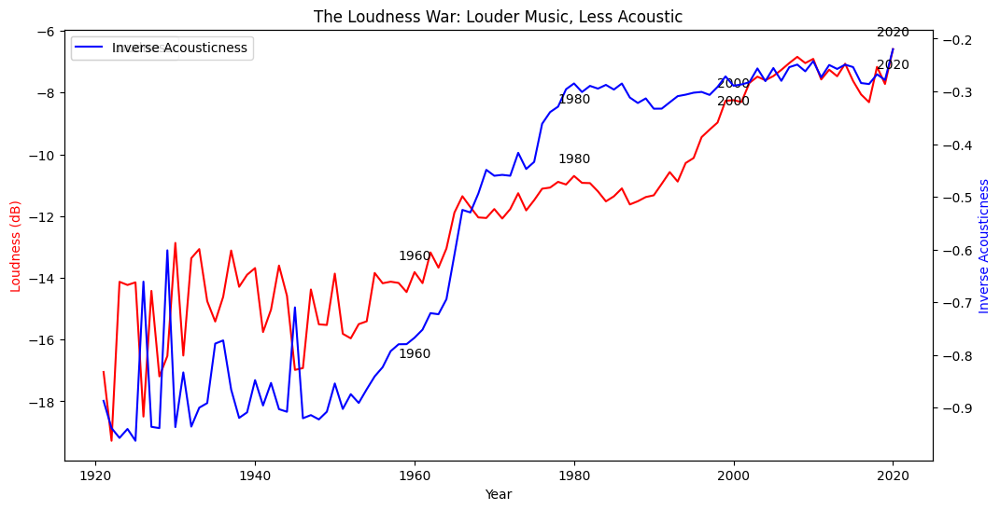

In [ ]:
plt.figure(figsize=(12, 6))

# Loudness trend
ax1 = sns.lineplot(x='year', y='loudness', data=year_data, label='Loudness', color='red')

# Acousticness trend (inverse)
ax2 = ax1.twinx()
sns.lineplot(x='year', y=-year_data['acousticness'], data=year_data, label='Inverse Acousticness', ax=ax2, color='blue')


# Add annotations for key years
key_years = [1960, 1980, 2000, 2020]
for year in key_years:
    loudness_val = year_data.loc[year_data['year'] == year, 'loudness'].values[0]
    acousticness_val = -year_data.loc[year_data['year'] == year, 'acousticness'].values[0]
    ax1.annotate(f'{year}', (year, loudness_val), textcoords="offset points", xytext=(0,10), ha='center', fontsize=10)
    ax2.annotate(f'{year}', (year, acousticness_val), textcoords="offset points", xytext=(0,-15), ha='center', fontsize=10)


plt.title('The Loudness War: Louder Music, Less Acoustic')
ax1.set_xlabel('Year')
ax1.set_ylabel('Loudness (dB)', color='red')
ax2.set_ylabel('Inverse Acousticness', color='blue')
plt.legend(loc='upper left')
plt.show()

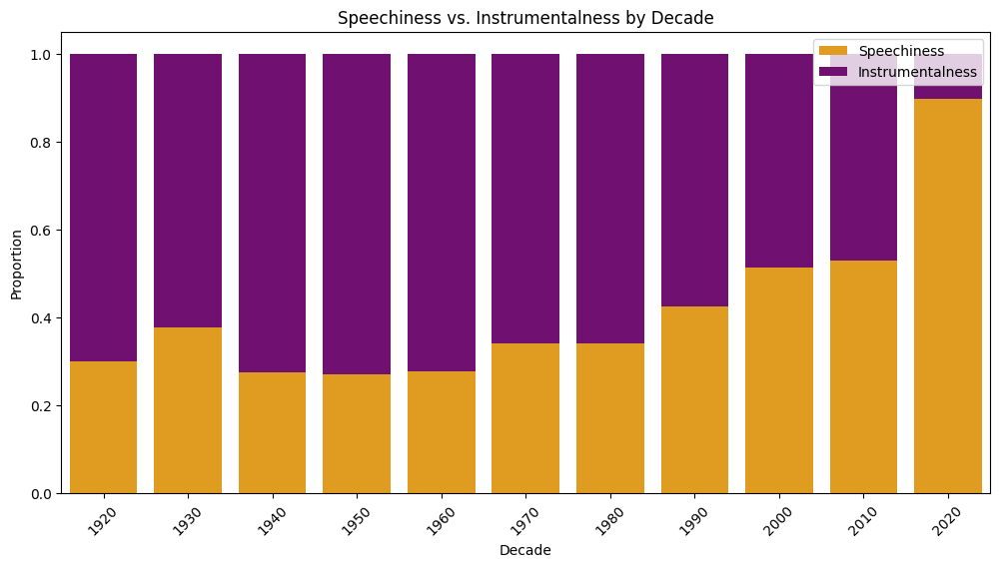

In [ ]:
# Create a new column for decades
year_data['decade'] = (year_data['year'] // 10) * 10

# Calculate proportions
year_data['speechiness_prop'] = year_data['speechiness'] / (year_data['speechiness'] + year_data['instrumentalness'])
year_data['instrumentalness_prop'] = year_data['instrumentalness'] / (year_data['speechiness'] + year_data['instrumentalness'])

# Group by decade and calculate mean proportions
proportions_by_decade = year_data.groupby('decade')[['speechiness_prop', 'instrumentalness_prop']].mean().reset_index()

# Stacked bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='decade', y='speechiness_prop', data=proportions_by_decade, color='orange', label='Speechiness')
sns.barplot(x='decade', y='instrumentalness_prop', data=proportions_by_decade, bottom=proportions_by_decade['speechiness_prop'], color='purple', label='Instrumentalness')

plt.title('Speechiness vs. Instrumentalness by Decade')
plt.xlabel('Decade')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.legend()
plt.show()

## Applying PCA

In [ ]:
data.columns

Index(['valence', 'year', 'acousticness', 'artists', 'danceability',
       'duration_ms', 'energy', 'explicit', 'instrumentalness', 'key',
       'liveness', 'loudness', 'name', 'popularity', 'speechiness', 'tempo',
       'is_popular', 'cluster'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Drop irrelevant columns
data.drop(columns=['artists','name','year'], inplace=True)

# Split dataset
X = data.drop(columns=['popularity'])
y = data['popularity']
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)



In [ ]:
# # print(X_train.dtypes)  # Check column data types
# for col in X_train.columns:
#     if X_train[col].dtype == 'object':  # If column contains strings
#         print(f"Non-numeric column: {col}")
#         print(X_train[col].unique())  # Show unique values in the column



# print(X_train.isnull().sum())  # Check for missing values in each column
# print(X_val.isnull().sum())
# print(X_test.isnull().sum())



In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures

# Apply PCA
pca = PCA(n_components=5)
X_train_pca = pca.fit_transform(X_train)
X_val_pca = pca.transform(X_val)
X_test_pca = pca.transform(X_test)

# Create interaction terms
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_val_poly = poly.transform(X_val)
X_test_poly = poly.transform(X_test)

## OLS MODEL

                            OLS Regression Results                            
Dep. Variable:             popularity   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.040
Method:                 Least Squares   F-statistic:                     7081.
Date:                Mon, 03 Feb 2025   Prob (F-statistic):               0.00
Time:                        16:17:46   Log-Likelihood:            -7.6482e+05
No. Observations:              170653   AIC:                         1.530e+06
Df Residuals:                  170651   BIC:                         1.530e+06
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           18.1394      0.166    109.124   

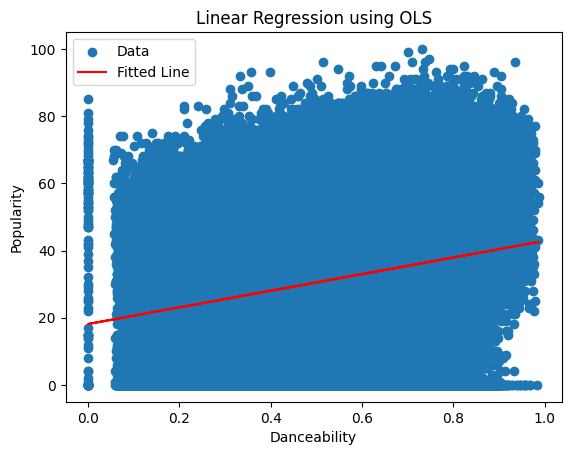

In [ ]:
import statsmodels.api as sm

from sklearn.preprocessing import PolynomialFeatures


X_OLS = data[['danceability']]  # Example with two features
Y_OLS = data['popularity']    # Target variable# Prepare the data for statsmodels
X_OLS = sm.add_constant(X_OLS)  # Adds a constant term (intercept) to the predictor

# poly = PolynomialFeatures(degree=2, include_bias=False)
# X_poly = poly.fit_transform(data[['danceability', 'energy']])
# X_OLS = sm.add_constant(X_poly)

# Create the OLS model
model = sm.OLS(Y_OLS, X_OLS)
results = model.fit()

# Print the summary of the regression
print(results.summary())

# Predicted values
predictions = results.predict(X_OLS)

# residuals = Y_OLS - predictions
# plt.scatter(predictions, residuals)
# plt.axhline(0, color='red', linestyle='--')
# plt.xlabel("Predicted Values")
# plt.ylabel("Residuals")
# plt.title("Residual Plot")
# plt.show()

# Visualize the results
plt.scatter(data['danceability'], Y_OLS, label="Data")
plt.plot(data['danceability'], predictions, color="red", label="Fitted Line")
plt.xlabel("Danceability")
plt.ylabel("Popularity")
plt.legend()
plt.title("Linear Regression using OLS")
plt.show()

## Logistic Regression

In [ ]:
print(data.columns)

Index(['valence', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'explicit', 'instrumentalness', 'key', 'liveness', 'loudness',
       'popularity', 'speechiness', 'tempo', 'is_popular', 'cluster'],
      dtype='object')


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



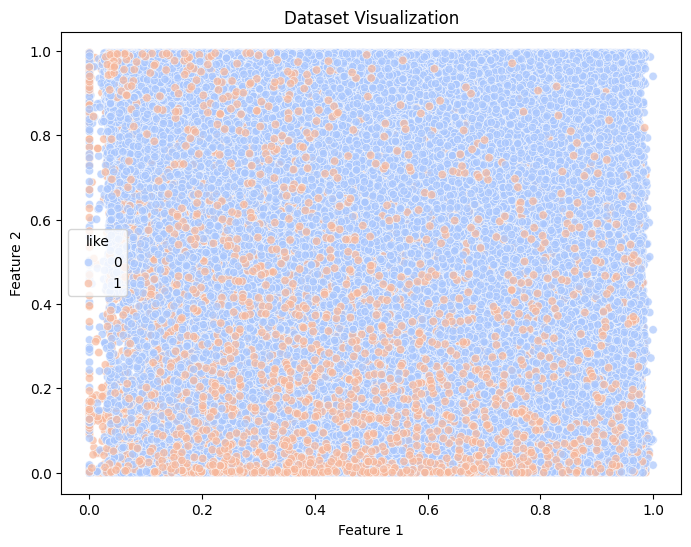

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Logistic Regression Accuracy: 0.87
Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92     20147
           1       0.81      0.49      0.61      5451

    accuracy                           0.87     25598
   macro avg       0.84      0.73      0.76     25598
weighted avg       0.86      0.87      0.85     25598



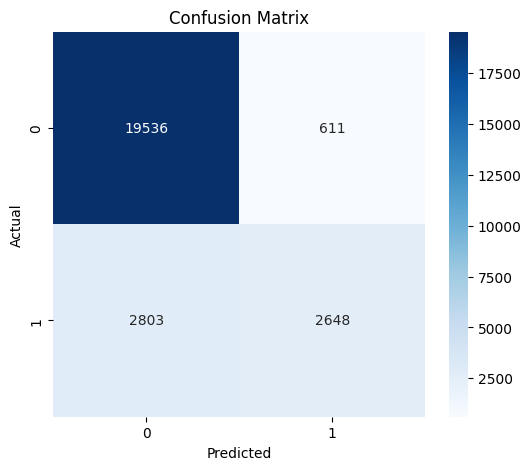

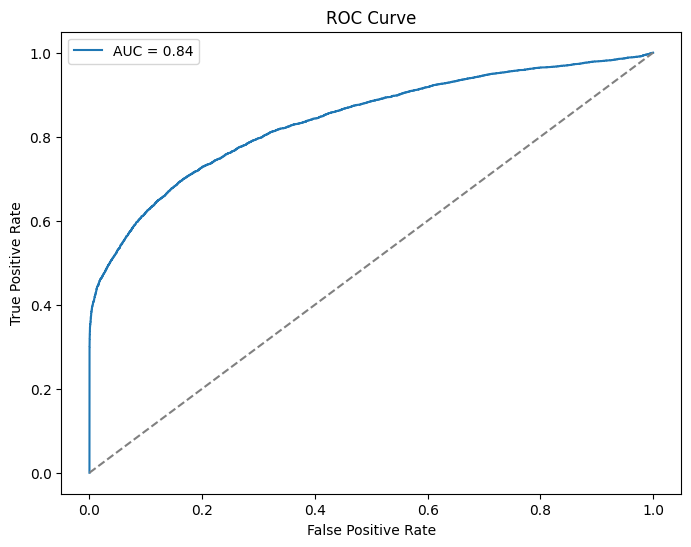

Model Coefficients:
Intercept: -0.57
Coefficient for feature 1: -0.89
Coefficient for feature 2: -0.97
Coefficient for feature 3: 0.02
Coefficient for feature 4: -0.00
Coefficient for feature 5: -0.15
Coefficient for feature 6: 0.73
Coefficient for feature 7: -0.54
Coefficient for feature 8: -0.06
Coefficient for feature 9: -0.39
Coefficient for feature 10: 1.46
Coefficient for feature 11: -0.15
Coefficient for feature 12: 0.18
Coefficient for feature 13: 2.88
Coefficient for feature 14: 0.25


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix,
                             roc_curve, auc)

# Define binary target based on 'popularity'
data['like'] = (data['popularity'] > 50).astype(int)

# For example, if 'popularity' and 'like' should be excluded:
X = data.drop(['popularity', 'like'], axis=1)
y = data['like']

# Split Data into Training, Validation, and Test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


# Visualize Dataset
# (Assuming the first two columns of X are representative for a 2D scatter plot)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X.iloc[:, 0], y=X.iloc[:, 1], hue=y, palette="coolwarm", alpha=0.7)
plt.title("Dataset Visualization")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

# Train Logistic Regression Model
logreg_model = LogisticRegression()
logreg_model.fit(X_train, y_train)

# Model Predictions on Test Data
y_pred = logreg_model.predict(X_test)

# Model Evaluation: Accuracy and Classification Report
accuracy = accuracy_score(y_test, y_pred)
print(f"Logistic Regression Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC Curve and AUC
y_prob = logreg_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.show()

# Model Coefficients
print("Model Coefficients:")
print(f"Intercept: {logreg_model.intercept_[0]:.2f}")
for i, coef in enumerate(logreg_model.coef_[0]):
    print(f"Coefficient for feature {i + 1}: {coef:.2f}")


## MLE

         Current function value: 0.301598
         Iterations: 35


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



                           Logit Regression Results                           
Dep. Variable:                   like   No. Observations:               119457
Model:                          Logit   Df Residuals:                   119442
Method:                           MLE   Df Model:                           14
Date:                Mon, 03 Feb 2025   Pseudo R-squ.:                  0.4177
Time:                        16:18:02   Log-Likelihood:                -36028.
converged:                      False   LL-Null:                       -61875.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -1.1213      0.059    -18.888      0.000      -1.238      -1.005
valence             -1.8031      0.050    -36.195      0.000      -1.901      -1.706
acousticness        -1.1658 

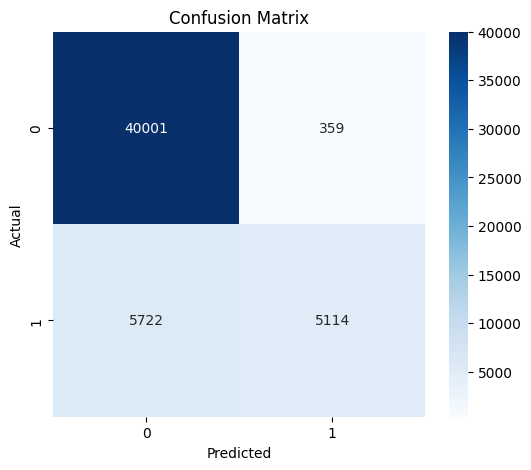

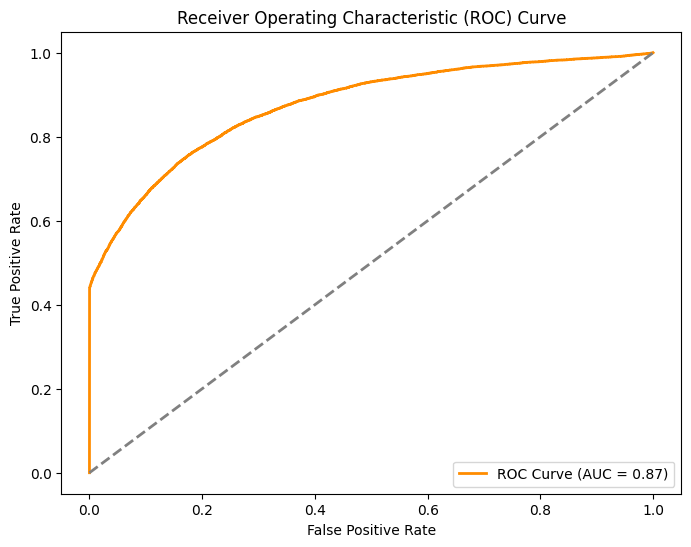

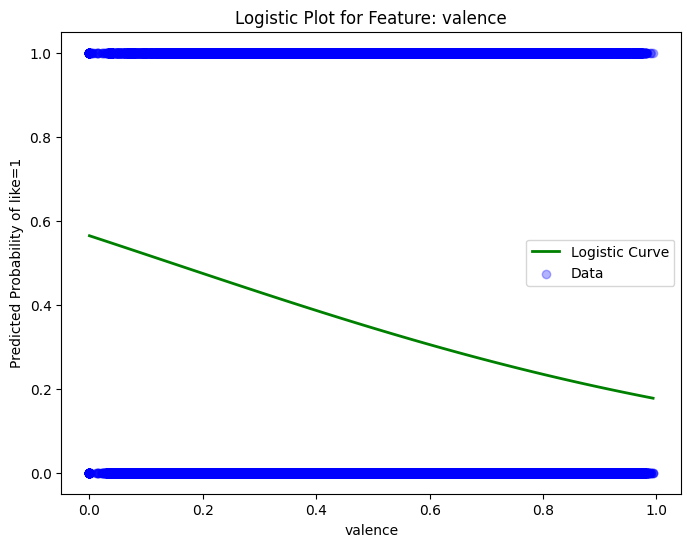

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc

# Define the target variable
data['like'] = (data['popularity'] > 50).astype(int)

# Prepare the data: drop 'popularity' and 'like' from features
X = data.drop(['popularity', 'like'], axis=1)
X = sm.add_constant(X)  # Add intercept term
y = data['like']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Fit the Logit model (MLE-based logistic regression)
logit_model = sm.Logit(y_train, X_train)
results = logit_model.fit()

# Print the summary
print(results.summary())

# Predict probabilities on the test set
y_prob = results.predict(X_test)

# Convert probabilities to binary predictions using 0.5 threshold
y_pred = (y_prob >= 0.5).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"\nAccuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix plot
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ----------------------------
# ROC Curve
# ----------------------------
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", lw=2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(loc="lower right")
plt.show()

# ----------------------------
# Logistic Plot for one feature
# ----------------------------
# Choose a predictor to visualize. We use the first non-constant column.
feature_to_plot = X.columns[1]  # assuming column 0 is the constant

# Create a range of values for the chosen feature
x_min = X_test[feature_to_plot].min()
x_max = X_test[feature_to_plot].max()
x_range = np.linspace(x_min, x_max, 100)

# Create a DataFrame that holds the mean values for all features
# and varies only the chosen feature
plot_df = X_test.copy().iloc[:100].mean().to_frame().T  # start with mean values
plot_df = plot_df.loc[plot_df.index.repeat(100)].reset_index(drop=True)
plot_df[feature_to_plot] = x_range

# Predict probabilities using the fitted model for the grid
predicted_probs = results.predict(plot_df)

plt.figure(figsize=(8, 6))
plt.plot(x_range, predicted_probs, color="green", lw=2, label="Logistic Curve")
plt.scatter(X_test[feature_to_plot], y_test, alpha=0.3, label="Data", color="blue")
plt.xlabel(feature_to_plot)
plt.ylabel("Predicted Probability of like=1")
plt.title(f"Logistic Plot for Feature: {feature_to_plot}")
plt.legend()
plt.show()


## Elasticnet Regularization

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


900 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
450 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py", line 654, in fit
    Xt = self._fit(X, y, routed_para

Best Logistic Regression Parameters: {'logreg__C': 10.0, 'logreg__l1_ratio': 0.1, 'logreg__penalty': 'l1', 'logreg__solver': 'saga', 'pca__n_components': 10}

Logistic Regression Evaluation:
Accuracy: 0.82
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.85      0.88     20147
           1       0.57      0.72      0.63      5451

    accuracy                           0.82     25598
   macro avg       0.74      0.79      0.76     25598
weighted avg       0.84      0.82      0.83     25598



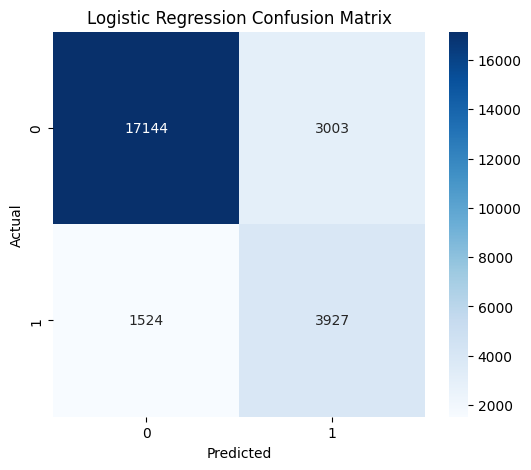

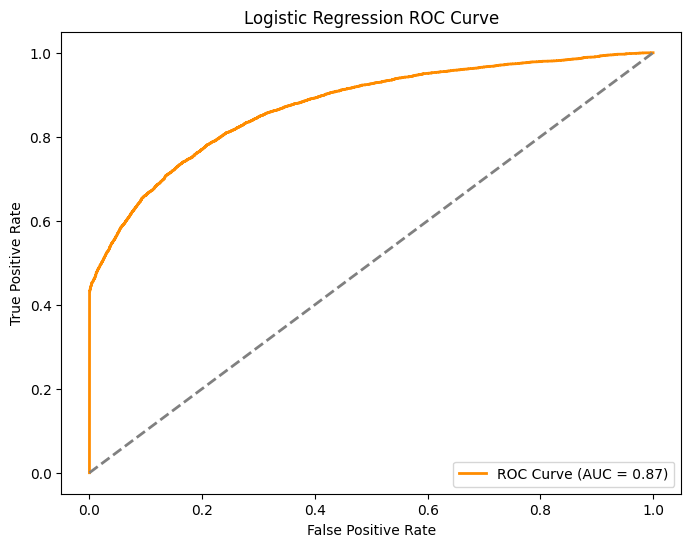

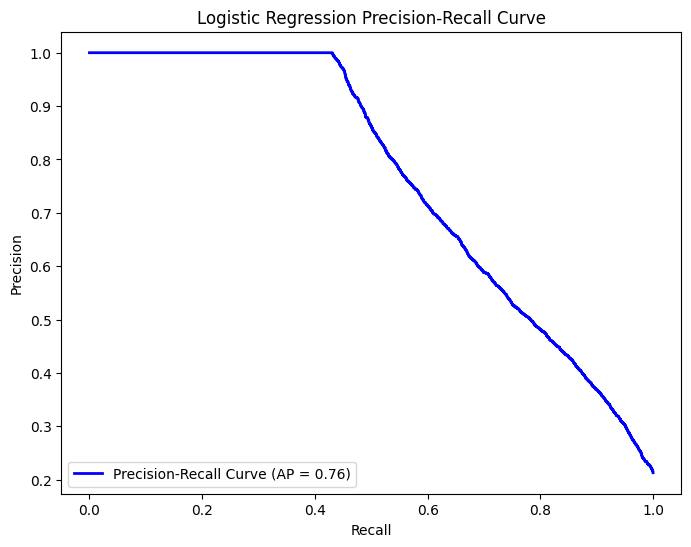

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE  # For handling class imbalance
from sklearn.pipeline import Pipeline

# Define the target variable
data['like'] = (data['popularity'] > 50).astype(int)

# Prepare the data: drop 'popularity' and 'like' from features
X = data.drop(['popularity', 'like'], axis=1)
y = data['like']

# Split the data into training, validation, and testing sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Handle class imbalance using SMOTE
# smote = SMOTE(random_state=42)
# X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# ----------------------------
# Cross-Validation for Logistic Regression (MLE) with PCA
# ----------------------------

logreg_pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Step 1: Scale the data
    ('pca', PCA()),               # Step 2: Apply PCA
    ('logreg', LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42))  # Step 3: Logistic Regression
])

logreg_param_grid = {
    'pca__n_components': [5, 10, 15, 20],  # Try more PCA components
    'logreg__C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],  # Wider range for regularization strength
    'logreg__penalty': ['l1', 'l2', 'elasticnet'],  # Include all penalties
    'logreg__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9],  # More granularity for ElasticNet mixing
    'logreg__solver': ['saga']  # Supports all penalties
}

logreg_grid_search = GridSearchCV(logreg_pipeline, logreg_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
logreg_grid_search.fit(X_train, y_train)

# Best Logistic Regression model
best_logreg_model = logreg_grid_search.best_estimator_
print(f"Best Logistic Regression Parameters: {logreg_grid_search.best_params_}")

# ----------------------------
# Evaluate the Model
# ----------------------------

# Predict probabilities on the test set
y_prob = best_logreg_model.predict_proba(X_test)[:, 1]

# Convert probabilities to binary predictions using 0.5 threshold
y_pred = (y_prob >= 0.5).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"\nLogistic Regression Evaluation:")
print(f"Accuracy: {accuracy:.2f}")
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix plot
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Logistic Regression Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})", color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", lw=2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression ROC Curve")
plt.legend(loc="lower right")
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(y_test, y_prob)
average_precision = average_precision_score(y_test, y_prob)
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f"Precision-Recall Curve (AP = {average_precision:.2f})", color='blue', lw=2)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Logistic Regression Precision-Recall Curve")
plt.legend(loc="lower left")
plt.show()

## Recommended System

In [ ]:
X_train.columns

Index(['valence', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'explicit', 'instrumentalness', 'key', 'liveness', 'loudness',
       'speechiness', 'tempo', 'is_popular', 'cluster'],
      dtype='object')

In [ ]:
!pip install scikit-surprise


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 6.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.4-cp311-cp311-linux_x86_64.whl size=2505179 sha256=e0fa47f3d6103206a395ec30c011593612904a79b4a7f5eaf5a2dd38eed6b2a3
  Stored in directory: /root/.cache/pip/wheels/2a/8f/6e/7e2899163e2d85d8266daab4aa1cdabec7a6c56f83c015b5af
Successfully built scikit-surprise


## Hybrid Model

Hybrid scores for user 500: [0.09534289 0.13428512 0.12699507 0.1378378  0.15886979 0.1582457
 0.15968867 0.14981546 0.14339666 0.03498798]
Relevant Tracks: ['47EiUVwUp4C9fGccaPuUCS' '3tjFYV6RSFtuktYl3ZtYcq'
 '0t1kP63rueHleOhQkYSXFY' '4Oun2ylbjFKMPTiaSbbCih'
 '35mvY5S1H3J2QZyna3TFe0' '1tkg4EHVoqnhR6iFEXb60y'
 '0VjIjW4GlUZAMYd2vXMi3b' '0PvFJmanyNQMseIFrU708S'
 '5u1n1kITHCxxp8twBcZxWy' '4y4spB9m0Q6026KfkAvy9Q']
Recommended Tracks: ['3pkzJjJXfdDjhpXx639MIH' '1uzWOoJdADfstQuFtQFTUn'
 '0T4YziOpifV4Eo9XsMPp2X' '5CRRLulIPmAYMQ6HRvgDPZ'
 '1ZVlKaThDlcDbyc9ea6anR' '4A8pBxx0of2Y8r56dT0atf'
 '4o6ZuLYr04LqFQNiSGVK4u' '1bYtKF2sY2wLU6xdVaqIqD'
 '0x4rW5jv6fkKweBgjE5O8F' '2QqJTIlGKRLJC3onkavYEz']
Tested Params: {'alpha': 0.5, 'beta': 0.3, 'gamma': 0.2}, Precision: 0.00
Hybrid scores for user 500: [0.06384054 0.09385966 0.08935797 0.11098526 0.13105691 0.13018319
 0.14042056 0.11302103 0.10939453 0.02418721]
Relevant Tracks: ['47EiUVwUp4C9fGccaPuUCS' '3tjFYV6RSFtuktYl3ZtYcq'
 '0t1kP63rueHleOhQkYSXFY' '4

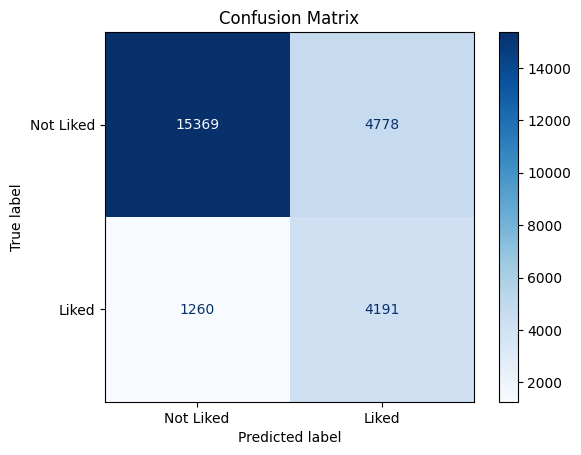

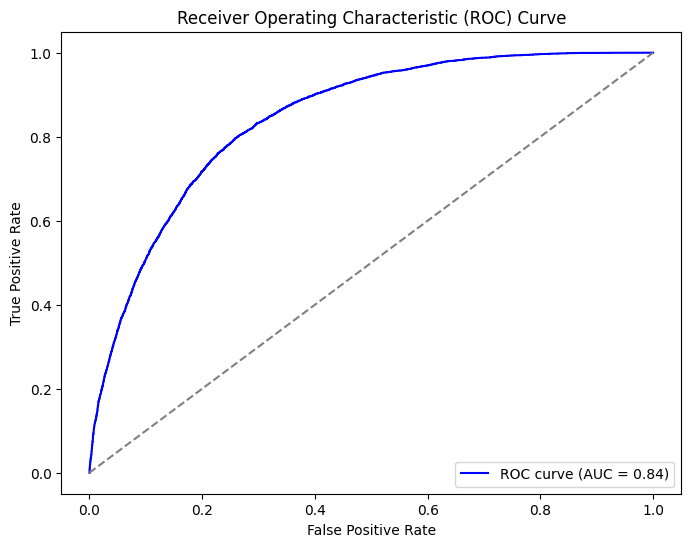

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split as surprise_train_test_split

data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data.csv')


# ----------------------------
# Load and Preprocess Data
# ----------------------------

# Define the target variable: Convert 'popularity' into a binary label
data['like'] = (data['popularity'] > 50).astype(int)

# Drop non-numeric and non-useful features
drop_columns = ['id', 'name', 'artists', 'release_date', 'popularity']
X = data.drop(columns=drop_columns + ['like'])
y = data['like']

# Split into training and testing sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# ----------------------------
# Content-Based Filtering (Logistic Regression)
# ----------------------------
# Define Pipeline
logreg_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=10)),  # Reduce dimensionality
    ('logreg', LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42))
])

# Train Logistic Regression
logreg_pipeline.fit(X_train_resampled, y_train_resampled)

# Predict probabilities for all songs
logreg_preds = logreg_pipeline.predict_proba(X)[:, 1]

# ----------------------------
# Collaborative Filtering (Matrix Factorization - SVD)
# ----------------------------
# Create user-song interaction matrix
user_song_data = data[['id', 'popularity']].copy()
user_song_data['user_id'] = np.random.randint(1, 1001, size=len(user_song_data))  # Fake user IDs
user_song_data['interaction'] = (user_song_data['popularity'] > 50).astype(int)

# Prepare data for Surprise library
reader = Reader(rating_scale=(0, 1))
interaction_data = Dataset.load_from_df(user_song_data[['user_id', 'id', 'interaction']], reader)

# Train-test split
trainset, testset = surprise_train_test_split(interaction_data, test_size=0.3)

# Train SVD model
svd = SVD(n_factors=50, random_state=42)
svd.fit(trainset)

# Generate SVD predictions for all songs
cf_preds = np.array([svd.predict(uid, iid).est for uid, iid in zip(user_song_data['user_id'], user_song_data['id'])])

# ----------------------------
# Similarity-Based Filtering (Nearest Neighbors)
# ----------------------------
# Normalize features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Fit Nearest Neighbors model using brute force algorithm
nn_model = NearestNeighbors(n_neighbors=10, metric='cosine', algorithm='brute')
nn_model.fit(X_scaled)

def get_similar_songs_nn(song_id, data, nn_model, n_neighbors=10):
    """
    Find similar songs using Nearest Neighbors.
    Parameters:
    - song_id: ID of the song to find similar songs for.
    - data: Dataset containing song features.
    - nn_model: Trained Nearest Neighbors model.
    - n_neighbors: Number of similar songs to return.
    Returns:
    - DataFrame of similar songs.
    """
    # Get index of the song
    song_index = data.index[data['id'] == song_id].tolist()[0]

    # Get feature vector of the song
    song_vector = X_scaled[song_index].reshape(1, -1)

    # Find nearest neighbors (excluding itself)
    distances, indices = nn_model.kneighbors(song_vector, n_neighbors=n_neighbors+1)

    # Get similar songs
    similar_songs = data.iloc[indices[0][1:]][['id', 'name', 'artists']]

    return similar_songs

# ----------------------------
# Hybrid Model (Weighted Combination)
# ----------------------------
def recommend_songs_hybrid_nn(user_id, data, svd_model, logreg_model, nn_model, alpha=0.5, beta=0.3, gamma=0.2, top_n=10):
    """
    Recommend songs using a hybrid model with Nearest Neighbors.
    Parameters:
    - user_id: ID of the user for whom recommendations are generated.
    - data: The dataset containing song information.
    - svd_model: Trained SVD model.
    - logreg_model: Trained logistic regression pipeline.
    - nn_model: Trained Nearest Neighbors model.
    - alpha: Weight for content-based filtering.
    - beta: Weight for collaborative filtering.
    - gamma: Weight for similarity-based filtering.
    - top_n: Number of recommendations to return.
    Returns:
    - DataFrame of top N recommended songs.
    """
    # Get songs the user has interacted with
    user_songs = user_song_data[user_song_data['user_id'] == user_id]

    # If user has no history, return top popular songs
    if user_songs.empty:
        print("No user history found, recommending popular songs.")
        return data.sort_values(by="popularity", ascending=False).head(top_n)[['id', 'name', 'artists']]

    # Get content-based predictions (Logistic Regression)
    song_features = data.drop(columns=['id', 'name', 'artists', 'release_date', 'popularity', 'like'])
    logreg_preds = logreg_model.predict_proba(song_features)[:, 1]

    # Get collaborative filtering predictions (SVD)
    cf_preds = np.array([svd_model.predict(user_id, song_id).est for song_id in data['id']])

    # Get similarity-based recommendations
    similar_scores = np.zeros(len(data))

    for song_id in user_songs['id']:
        similar_songs = get_similar_songs_nn(song_id, data, nn_model, n_neighbors=10)
        similar_scores[data.index[data['id'].isin(similar_songs['id'])]] += 1

    similar_scores /= similar_scores.max()  # Normalize scores

    # Normalize all scores
    scaler = MinMaxScaler()
    logreg_preds_norm = scaler.fit_transform(logreg_preds.reshape(-1, 1)).flatten()
    cf_preds_norm = scaler.fit_transform(cf_preds.reshape(-1, 1)).flatten()
    similar_scores_norm = scaler.fit_transform(similar_scores.reshape(-1, 1)).flatten()

    # Compute final hybrid score
    hybrid_scores = alpha * logreg_preds_norm + beta * cf_preds_norm + gamma * similar_scores_norm

    # Debug: Print hybrid scores
    print(f"Hybrid scores for user {user_id}: {hybrid_scores[:10]}")

    # Create a recommendations DataFrame
    recommendations = data[['id', 'name', 'artists']].copy()
    recommendations['hybrid_score'] = hybrid_scores

    # Sort by highest predicted score
    recommendations = recommendations.sort_values(by='hybrid_score', ascending=False)

    return recommendations.head(top_n)

# ----------------------------
# Evaluate Hybrid Model
# ----------------------------
def evaluate_hybrid_model(alpha, beta, gamma, data, svd_model, logreg_model, nn_model, user_id, top_n=10):
    # Generate hybrid recommendations
    recommendations = recommend_songs_hybrid_nn(
        user_id=user_id,
        data=data,
        svd_model=svd_model,
        logreg_model=logreg_model,
        nn_model=nn_model,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        top_n=top_n
    )

    # Simulate ground truth relevance (e.g., based on popularity or other criteria)
    relevant_tracks = data.sort_values(by="popularity", ascending=False).head(top_n)['id'].values
    recommended_tracks = recommendations['id'].values

    # Debug: Print relevant and recommended tracks
    print(f"Relevant Tracks: {relevant_tracks}")
    print(f"Recommended Tracks: {recommended_tracks}")

    # Calculate precision@K
    precision = len(set(recommended_tracks).intersection(set(relevant_tracks))) / top_n if top_n > 0 else 0
    return precision

# ----------------------------
# Simplified Weight Tuning
# ----------------------------
weights_to_test = [
    {'alpha': 0.5, 'beta': 0.3, 'gamma': 0.2},
    {'alpha': 0.7, 'beta': 0.2, 'gamma': 0.1},
    {'alpha': 0.3, 'beta': 0.5, 'gamma': 0.2}
]

best_precision = 0
best_params = {}
for params in weights_to_test:
    precision = evaluate_hybrid_model(
        params['alpha'],
        params['beta'],
        params['gamma'],
        data=data,
        svd_model=svd,
        logreg_model=logreg_pipeline,
        nn_model=nn_model,
        user_id=500,
        top_n=10
    )
    print(f"Tested Params: {params}, Precision: {precision:.2f}")
    if precision > best_precision:
        best_precision = precision
        best_params = params

print(f"Best Parameters: {best_params}, Best Precision: {best_precision:.2f}")

# ----------------------------
# Example Usage
# ----------------------------
user_id = 500  # Change this to a valid user ID
top_recommendations = recommend_songs_hybrid_nn(
    user_id=user_id,
    data=data,
    svd_model=svd,
    logreg_model=logreg_pipeline,
    nn_model=nn_model,
    alpha=best_params.get('alpha', 0.5),
    beta=best_params.get('beta', 0.3),
    gamma=best_params.get('gamma', 0.2),
    top_n=10
)

# Display recommendations
print("\nTop 10 Recommended Songs:")
print(top_recommendations)

from sklearn.metrics import accuracy_score, classification_report, roc_curve, auc, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Predict on test set
y_test_preds = logreg_pipeline.predict(X_test)
y_test_probs = logreg_pipeline.predict_proba(X_test)[:, 1]  # Probabilities for ROC Curve

# Compute Accuracy
accuracy = accuracy_score(y_test, y_test_preds)
print(f"\nAccuracy: {accuracy:.2f}")

# Print Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_test_preds))

# Compute Confusion Matrix
cm = confusion_matrix(y_test, y_test_preds)

# Display Confusion Matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not Liked', 'Liked'])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Compute ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_test_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random chance line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


## After CLustering

Relevant Tracks: ['47EiUVwUp4C9fGccaPuUCS' '3tjFYV6RSFtuktYl3ZtYcq'
 '0t1kP63rueHleOhQkYSXFY' '4Oun2ylbjFKMPTiaSbbCih'
 '35mvY5S1H3J2QZyna3TFe0' '1tkg4EHVoqnhR6iFEXb60y'
 '0VjIjW4GlUZAMYd2vXMi3b' '0PvFJmanyNQMseIFrU708S'
 '5u1n1kITHCxxp8twBcZxWy' '4y4spB9m0Q6026KfkAvy9Q']
Recommended Tracks: ['04QKeqtQ1KCDHTXK6mNwqX' '7k1pfmKI7t0AprW7SEdFpC'
 '3ogtSrlbtiTamktbA0hw0E' '23zxVVtHjo2mbtAoAg5XB4'
 '4p1pxmqtPtPHqWbOd2RgXu' '0JfAMd3xTqm7ZYhBmQjYzt'
 '5BLRlpMYsxeMMOjrcWRhIs' '1fbLPjsAXq7gZPtOK9QCZU'
 '2FY7b99s15jUprqC0M5NCT' '5XQv5uep3VmhEuDWeFwRep']
Tested Params: {'alpha': 0.5, 'beta': 0.3, 'gamma': 0.2}, Precision: 0.00
Relevant Tracks: ['47EiUVwUp4C9fGccaPuUCS' '3tjFYV6RSFtuktYl3ZtYcq'
 '0t1kP63rueHleOhQkYSXFY' '4Oun2ylbjFKMPTiaSbbCih'
 '35mvY5S1H3J2QZyna3TFe0' '1tkg4EHVoqnhR6iFEXb60y'
 '0VjIjW4GlUZAMYd2vXMi3b' '0PvFJmanyNQMseIFrU708S'
 '5u1n1kITHCxxp8twBcZxWy' '4y4spB9m0Q6026KfkAvy9Q']
Recommended Tracks: ['04QKeqtQ1KCDHTXK6mNwqX' '5BLRlpMYsxeMMOjrcWRhIs'
 '7k1pfmKI7t0AprW7SEdFpC' '2bDXmd

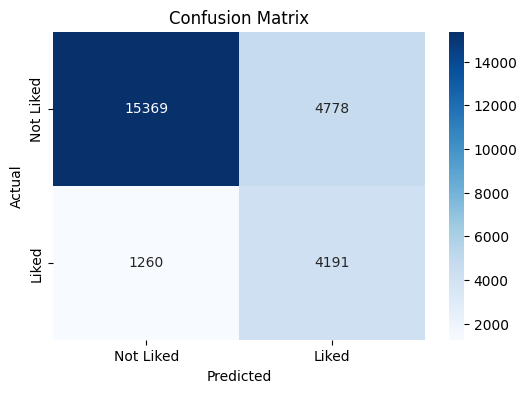


Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.76      0.84     20147
           1       0.47      0.77      0.58      5451

    accuracy                           0.76     25598
   macro avg       0.70      0.77      0.71     25598
weighted avg       0.83      0.76      0.78     25598



In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from surprise import SVD, Dataset, Reader
from surprise.model_selection import train_test_split as surprise_train_test_split
from sklearn.metrics import roc_auc_score, confusion_matrix, classification_report




# ----------------------------
# Load and Preprocess Data
# ----------------------------
data = pd.read_csv('/content/drive/MyDrive/colab-datasets/Spotify/data.csv')

# Define the target variable: Convert 'popularity' into a binary label
data['like'] = (data['popularity'] > 50).astype(int)

# Drop non-numeric and non-useful features
drop_columns = ['id', 'name', 'artists', 'release_date', 'popularity']  # Include 'cluster' in drop list
X = data.drop(columns=drop_columns + ['like'])
y = data['like']

# Split into training and testing sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# ----------------------------
# Content-Based Filtering (Logistic Regression)
# ----------------------------
# Define Pipeline
logreg_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=10)),  # Reduce dimensionality
    ('logreg', LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42))
])

# Train Logistic Regression
logreg_pipeline.fit(X_train_resampled, y_train_resampled)

# Predict probabilities for all songs
logreg_preds = logreg_pipeline.predict_proba(X)[:, 1]

# ----------------------------
# Collaborative Filtering (Matrix Factorization - SVD)
# ----------------------------
# Create user-song interaction matrix
user_song_data = data[['id', 'popularity']].copy()
user_song_data['user_id'] = np.random.randint(1, 1001, size=len(user_song_data))  # Fake user IDs
user_song_data['interaction'] = (user_song_data['popularity'] > 50).astype(int)

# Prepare data for Surprise library
reader = Reader(rating_scale=(0, 1))
interaction_data = Dataset.load_from_df(user_song_data[['user_id', 'id', 'interaction']], reader)

# Train-test split
trainset, testset = surprise_train_test_split(interaction_data, test_size=0.2)

# Train SVD model
svd = SVD(n_factors=50, random_state=42)
svd.fit(trainset)

# Generate SVD predictions for all songs
cf_preds = np.array([svd.predict(uid, iid).est for uid, iid in zip(user_song_data['user_id'], user_song_data['id'])])

# ----------------------------
# Similarity-Based Filtering (Nearest Neighbors)
# ----------------------------
# Normalize features
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

# Fit Nearest Neighbors model using brute force algorithm
nn_model = NearestNeighbors(n_neighbors=10, metric='cosine', algorithm='brute')
nn_model.fit(X_scaled)

def get_similar_songs_nn(song_id, data, nn_model, n_neighbors=10):
    """
    Find similar songs using Nearest Neighbors.
    Parameters:
    - song_id: ID of the song to find similar songs for.
    - data: Dataset containing song features.
    - nn_model: Trained Nearest Neighbors model.
    - n_neighbors: Number of similar songs to return.
    Returns:
    - DataFrame of similar songs.
    """
    # Get index of the song
    song_index = data.index[data['id'] == song_id].tolist()[0]

    # Get feature vector of the song
    song_vector = X_scaled[song_index].reshape(1, -1)

    # Find nearest neighbors (excluding itself)
    distances, indices = nn_model.kneighbors(song_vector, n_neighbors=n_neighbors+1)

    # Get similar songs
    similar_songs = data.iloc[indices[0][1:]][['id', 'name', 'artists']]

    return similar_songs

from sklearn.cluster import KMeans

# ----------------------------
# Clustering Songs (K-Means)
# ----------------------------
num_clusters = 10  # Adjust based on dataset size
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
data['cluster'] = kmeans.fit_predict(X_scaled)

# ----------------------------
# Hybrid Recommendation with Clustering
# ----------------------------
def recommend_songs_hybrid_nn(user_id, data, svd_model, logreg_model, nn_model, alpha=0.5, beta=0.3, gamma=0.2, delta=0.2, top_n=10):
    # Get songs the user has interacted with
    user_songs = user_song_data[user_song_data['user_id'] == user_id]

    if user_songs.empty:
        print("No user history found, recommending popular songs.")
        return data.sort_values(by="popularity", ascending=False).head(top_n)[['id', 'name', 'artists']]

    # Identify the most frequent clusters the user interacted with
    user_clusters = data[data['id'].isin(user_songs['id'])]['cluster'].value_counts().index[:3]

    # Get content-based predictions
    song_features = data.drop(columns=['id', 'name', 'artists', 'release_date', 'popularity', 'like', 'cluster'])  # Ensure 'cluster' is excluded
    logreg_preds = logreg_model.predict_proba(song_features)[:, 1]


    # Get collaborative filtering predictions (SVD)
    cf_preds = np.array([svd_model.predict(user_id, song_id).est for song_id in data['id']])

    # Get similarity-based recommendations
    similar_scores = np.zeros(len(data))
    for song_id in user_songs['id']:
        similar_songs = get_similar_songs_nn(song_id, data, nn_model, n_neighbors=10)
        similar_scores[data.index[data['id'].isin(similar_songs['id'])]] += 1
    similar_scores /= similar_scores.max()

    # Cluster-based scoring: Boost scores for songs in user-preferred clusters
    cluster_scores = data['cluster'].apply(lambda x: 1 if x in user_clusters else 0)

    # Normalize all scores
    scaler = MinMaxScaler()
    logreg_preds_norm = scaler.fit_transform(logreg_preds.reshape(-1, 1)).flatten()
    cf_preds_norm = scaler.fit_transform(cf_preds.reshape(-1, 1)).flatten()
    similar_scores_norm = scaler.fit_transform(similar_scores.reshape(-1, 1)).flatten()
    cluster_scores_norm = scaler.fit_transform(cluster_scores.values.reshape(-1, 1)).flatten()

    # Compute final hybrid score with clustering factor
    hybrid_scores = (
        alpha * logreg_preds_norm +
        beta * cf_preds_norm +
        gamma * similar_scores_norm +
        delta * cluster_scores_norm
    )

    recommendations = data[['id', 'name', 'artists']].copy()
    recommendations['hybrid_score'] = hybrid_scores
    recommendations = recommendations.sort_values(by='hybrid_score', ascending=False)

    return recommendations.head(top_n)


# ----------------------------
# Evaluate Hybrid Model
# ----------------------------
def evaluate_hybrid_model(alpha, beta, gamma, data, svd_model, logreg_model, nn_model, user_id, top_n=10):
    # Generate hybrid recommendations
    recommendations = recommend_songs_hybrid_nn(
        user_id=user_id,
        data=data,
        svd_model=svd_model,
        logreg_model=logreg_model,
        nn_model=nn_model,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        top_n=top_n
    )

    # Simulate ground truth relevance (e.g., based on popularity or other criteria)
    relevant_tracks = data.sort_values(by="popularity", ascending=False).head(top_n)['id'].values
    recommended_tracks = recommendations['id'].values

    # Debug: Print relevant and recommended tracks
    print(f"Relevant Tracks: {relevant_tracks}")
    print(f"Recommended Tracks: {recommended_tracks}")

    # Calculate precision@K
    precision = len(set(recommended_tracks).intersection(set(relevant_tracks))) / top_n if top_n > 0 else 0
    return precision

# ----------------------------
# Simplified Weight Tuning
# ----------------------------
weights_to_test = [
    {'alpha': 0.5, 'beta': 0.3, 'gamma': 0.2},
    {'alpha': 0.7, 'beta': 0.2, 'gamma': 0.1},
    {'alpha': 0.3, 'beta': 0.5, 'gamma': 0.2}
]

best_precision = 0
best_params = {}
for params in weights_to_test:
    precision = evaluate_hybrid_model(
        params['alpha'],
        params['beta'],
        params['gamma'],
        data=data,
        svd_model=svd,
        logreg_model=logreg_pipeline,
        nn_model=nn_model,
        user_id=500,
        top_n=10
    )
    print(f"Tested Params: {params}, Precision: {precision:.2f}")
    if precision > best_precision:
        best_precision = precision
        best_params = params

print(f"Best Parameters: {best_params}, Best Precision: {best_precision:.2f}")

# ----------------------------
# Example Usage
# ----------------------------
user_id = 500  # Change this to a valid user ID
top_recommendations = recommend_songs_hybrid_nn(
    user_id=user_id,
    data=data,
    svd_model=svd,
    logreg_model=logreg_pipeline,
    nn_model=nn_model,
    alpha=best_params.get('alpha', 0.5),
    beta=best_params.get('beta', 0.3),
    gamma=best_params.get('gamma', 0.2),
    top_n=10
)

# Display recommendations
print("\nTop 10 Recommended Songs:")
print(top_recommendations)

#  add clustering here

# ----------------------------
# Evaluate Classification Model (Logistic Regression)
# ----------------------------
# Predict on test set
y_test_pred = logreg_pipeline.predict(X_test)
y_test_prob = logreg_pipeline.predict_proba(X_test)[:, 1]

# Compute ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_test_prob)
print(f"ROC-AUC Score: {roc_auc:.2f}")

# Generate Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)
print("\nConfusion Matrix:")
print(conf_matrix)

# Visualizing the Confusion Matrix
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Liked', 'Liked'], yticklabels=['Not Liked', 'Liked'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
class_report = classification_report(y_test, y_test_pred)
print("\nClassification Report:")
print(class_report)

## NCF

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 1)              │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, 1)              │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 1, 50)          │         50,000 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding_1 (Embedding)   │ (None, 1, 50)          │      8,532,650 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten (Flatten)         │ (None, 50)             │              0 │ embedding[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 50)             │              0 │ embedding_1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 100)            │              0 │ flatten[0][0],         │
│                           │                        │                │ flatten_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 128)            │         12,928 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 64)             │          8,256 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 32)             │          2,080 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1)              │             33 │ dense_2[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 8,605,947 (32.83 MB)

 Trainable params: 8,605,947 (32.83 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 145s 152ms/step - accuracy: 0.7450 - loss: 0.5728 - val_accuracy: 0.8683 - val_loss: 0.4242
Epoch 2/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 141s 151ms/step - accuracy: 0.9313 - loss: 0.1520 - val_accuracy: 0.6095 - val_loss: 1.0131
Epoch 3/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 150s 160ms/step - accuracy: 1.0000 - loss: 7.0847e-05 - val_accuracy: 0.5693 - val_loss: 1.2303
Epoch 4/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 199s 157ms/step - accuracy: 1.0000 - loss: 1.6485e-05 - val_accuracy: 0.5602 - val_loss: 1.3197
Epoch 5/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 139s 149ms/step - accuracy: 1.0000 - loss: 7.2794e-06 - val_accuracy: 0.5549 - val_loss: 1.3932
Epoch 6/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 154s 165ms/step - accuracy: 1.0000 - loss: 3.6310e-06 - val_accuracy: 0.5512 - val_loss: 1.4595
Epoch 7/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 187s 149ms/step - accuracy: 1.0000 - loss: 1.9437e-06 - val_accuracy: 0.5474 - val_loss: 1.5220
Epoch 8/10
934/934 ━━━━━━━━━━━━━━━━━━━━ 141s 151ms/step 

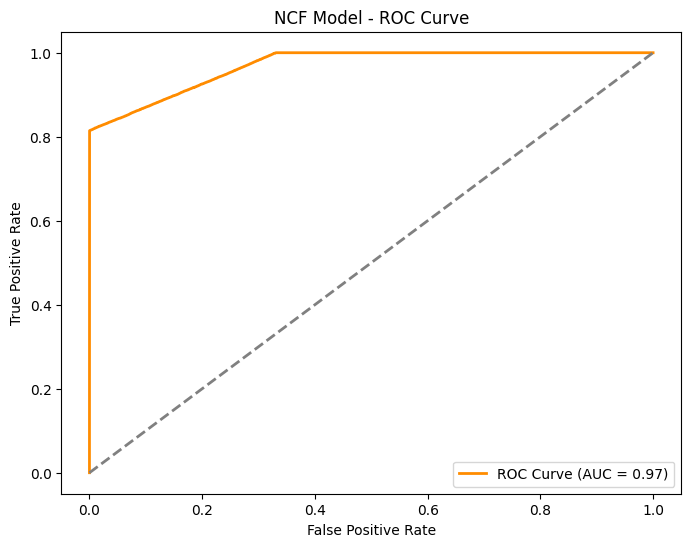

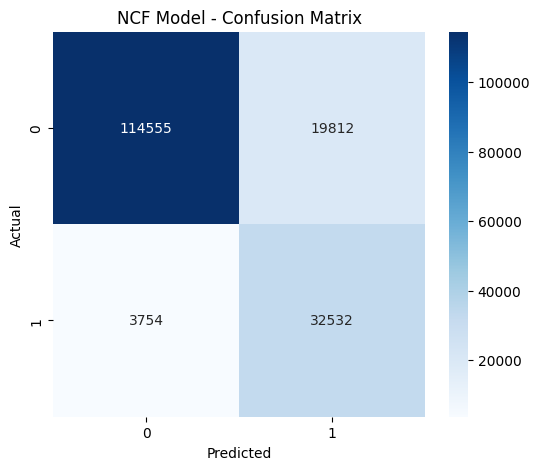

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.85      0.91    134367
           1       0.62      0.90      0.73     36286

    accuracy                           0.86    170653
   macro avg       0.79      0.87      0.82    170653
weighted avg       0.89      0.86      0.87    170653



In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Embedding, Flatten, Dense, Concatenate
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------
# Fix User-Item Interaction Data
# ----------------------------
if 'user_id' not in data.columns:
    np.random.seed(42)
    data['user_id'] = np.random.randint(1, 1001, size=len(data))  # Generate fake user IDs

if 'like' not in data.columns:
    data['like'] = (data['popularity'] > 50).astype(int)  # Define target

# Map users and items to unique indices
user2idx = {u: i for i, u in enumerate(data['user_id'].unique())}
item2idx = {i: j for j, i in enumerate(data['id'].unique())}

data['user_idx'] = data['user_id'].map(user2idx)
data['item_idx'] = data['id'].map(item2idx)

# ----------------------------
# Prepare Training Data for NCF
# ----------------------------
X_train = [data['user_idx'].values, data['item_idx'].values]
y_train = data['like'].values

# ----------------------------
# Define NCF Model
# ----------------------------
num_users = len(user2idx)
num_items = len(item2idx)
embedding_dim = 50

# Input Layers
user_input = Input(shape=(1,))
item_input = Input(shape=(1,))

# Embedding Layers
user_embedding = Embedding(num_users, embedding_dim)(user_input)
item_embedding = Embedding(num_items, embedding_dim)(item_input)

# Flatten Layers
user_vector = Flatten()(user_embedding)
item_vector = Flatten()(item_embedding)

# Concatenate User & Item Embeddings
concat = Concatenate()([user_vector, item_vector])

# Fully Connected Layers
hidden = Dense(128, activation='relu')(concat)
hidden = Dense(64, activation='relu')(hidden)
hidden = Dense(32, activation='relu')(hidden)
output = Dense(1, activation='sigmoid')(hidden)

# Compile Model
ncf_model = keras.Model(inputs=[user_input, item_input], outputs=output)
ncf_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
ncf_model.summary()

# Train Model
ncf_model.fit(X_train, y_train, epochs=10, batch_size=128, validation_split=0.3)

# ----------------------------
# Model Evaluation
# ----------------------------
# Get Predictions
pred_probs = ncf_model.predict(X_train).flatten()
pred_labels = (pred_probs >= 0.5).astype(int)

# Compute AUC-ROC
fpr, tpr, _ = roc_curve(y_train, pred_probs)
roc_auc = auc(fpr, tpr)

# Plot AUC-ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})', color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', lw=2)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("NCF Model - ROC Curve")
plt.legend(loc='lower right')
plt.show()

# Confusion Matrix
cm = confusion_matrix(y_train, pred_labels)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("NCF Model - Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_train, pred_labels))



## Recommendation System

In [ ]:
ngrok.kill()

# NCF + HYBRID

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics.pairwise import cosine_similarity
import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, Flatten, Dense, Concatenate
from tensorflow.keras.models import Model
from pyngrok import ngrok


In [ ]:
# Assuming 'data' is loaded as a DataFrame (replace with actual dataset loading)

# Define target variable
data['like'] = (data['popularity'] > 50).astype(int)

# Drop non-numeric and non-useful features
drop_columns = ['id', 'name', 'artists', 'release_date', 'popularity']
X = data.drop(columns=drop_columns + ['like'])
y = data['like']

# Train-test split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Handle class imbalance using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)


In [ ]:
# Train Content-Based Filtering (Logistic Regression)
logreg_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=10)),
    ('logreg', LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42))
])
logreg_pipeline.fit(X_train_resampled, y_train_resampled)



Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=10)),
                ('logreg',
                 LogisticRegression(class_weight='balanced', max_iter=10000,
                                    random_state=42))])

In [ ]:
def recommend_songs_ncf(user_id, data, model, top_n=10):
    if user_id not in user2idx:
        print("User not found! Recommending popular songs.")
        return data.sort_values(by="popularity", ascending=False).head(top_n)[['id', 'name', 'artists']]

    user_idx = user2idx[user_id]
    song_indices = np.array(list(item2idx.values()))
    user_indices = np.full_like(song_indices, user_idx)

    # Predict scores
    scores = model.predict([user_indices, song_indices]).flatten()

    # Get top-N recommendations
    top_song_indices = np.argsort(scores)[-top_n:][::-1]
    recommended_song_ids = [list(item2idx.keys())[i] for i in top_song_indices]

    return data[data['id'].isin(recommended_song_ids)][['id', 'name', 'artists']]

# Example Recommendation
user_id = 500
top_recommendations = recommend_songs_ncf(user_id, data, ncf_model, top_n=10)
print("\nTop 10 Recommended Songs:")
print(top_recommendations)

5333/5333 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step

Top 10 Recommended Songs:
                            id                         name  \
14060   5YY64mW5PL5waJKUsIJIQt                T-R-O-U-B-L-E   
15967   1X4Ntw6Lbaa1ACgilCqMpr  Alive - Chris Lord-Alge Mix   
15968   2eOuL8KesslTLQERQPu11D             Bad Boy for Life   
36634   1EQn3Uc5AyUXoiPLeyCrrg                         Ours   
54871   0p6UtCJowkcj4IXuQiOTQp                       Wisdom   
54872   6gA3b0M69d0SzuZqWtZXWD       Since You've Been Gone   
71069   5QYwIidpvmcqBWYx6hy8AT                  It'll Be OK   
74107   1pePqg6hTMeaTZNNECqT03                Boyz with Fun   
91354   7k9rcsOLrZBzxIL4cyAipZ               Merry Go Round   
104898  2AllsVsmrJkEwXPXwDBCQu                           單車   

                                     artists  
14060                       ['Travis Tritt']  
15967                             ['P.O.D.']  
15968   ['Diddy', 'Black Rob', 'Mark Curry']  
36634                       ['Taylor Swift']  


In [ ]:
scaler_nn = MinMaxScaler()
X_scaled = scaler_nn.fit_transform(X)
nn_model = NearestNeighbors(n_neighbors=10, metric='cosine', algorithm='brute')
nn_model.fit(X_scaled)


NearestNeighbors(algorithm='brute', metric='cosine', n_neighbors=10)

In [ ]:
def recommend_songs_hybrid_nn(user_id, data, ncf_model, logreg_model, nn_model,
                              danceability, energy, tempo, alpha=0.5, beta=0.3, gamma=0.2, top_n=10):
    """
    Recommend songs using a hybrid model that includes NCF, content-based, and similarity-based filtering.
    """
    # Content-based predictions using logistic regression
    song_features = data.drop(columns=['id', 'name', 'artists', 'release_date', 'popularity', 'like'])
    logreg_preds = logreg_model.predict_proba(song_features)[:, 1]

    # NCF predictions
    user_idx = user2idx.get(user_id, 0)
    song_indices = np.array(list(item2idx.values()))
    user_indices = np.full_like(song_indices, user_idx)
    ncf_preds = ncf_model.predict([user_indices, song_indices]).flatten()

    # Normalize scores
    norm_scaler = MinMaxScaler()
    logreg_preds_norm = norm_scaler.fit_transform(logreg_preds.reshape(-1, 1)).flatten()
    ncf_preds_norm = norm_scaler.fit_transform(ncf_preds.reshape(-1, 1)).flatten()

    # Compute hybrid score
    hybrid_scores = alpha * logreg_preds_norm + beta * ncf_preds_norm

    # Final recommendations
    recommendations = data[['id', 'name', 'artists']].copy()
    recommendations['final_score'] = hybrid_scores
    recommendations = recommendations.sort_values(by='final_score', ascending=False)

    return recommendations.head(top_n)


In [ ]:
ngrok.kill()

In [ ]:
!pip install dash plotly pyngrok


In [ ]:
print("Years Available:", data['year'].unique())

Years Available: [1921 1922 1923 1924 1925 1926 1927 1928 1929 1930 1931 1932 1933 1934
 1935 1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948
 1949 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962
 1963 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976
 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990
 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004
 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018
 2019 2020]


In [ ]:
# Import necessary libraries
import dash
from dash import dcc, html
from dash.dependencies import Input, Output, State
import plotly.express as px
from pyngrok import ngrok

# ----------------------------
# Initialize Dash App
# ----------------------------
app = dash.Dash(__name__)

# ----------------------------
# Dash App Layout
# ----------------------------
app.layout = html.Div([
    html.Div([
        html.H1("Spotify Recommendation Dashboard", style={'text-align': 'center', 'color': '#4CAF50'}),
        html.H2("Explore Tracks by Features", style={'text-align': 'center', 'color': '#555'}),
    ], style={'background-color': '#f0f0f0', 'padding': '20px'}),

    html.Div([
        html.Label("Select a Feature to Visualize:", style={'font-weight': 'bold'}),
        dcc.Dropdown(
            id='feature-dropdown',
            options=[{'label': col.capitalize(), 'value': col} for col in ['danceability', 'energy', 'valence', 'tempo', 'acousticness']],
            value='danceability',
            placeholder="Choose a feature",
            style={'width': '50%', 'margin-bottom': '20px'}
        ),
        html.Label("Select a Year:", style={'font-weight': 'bold'}),
        dcc.Dropdown(
            id='year-dropdown',
            options=[{'label': str(year), 'value': year} for year in sorted(data['year'].unique())],
            placeholder="Choose a year",
            style={'width': '50%'}
        )
    ], style={'text-align': 'center', 'padding': '20px'}),

    html.Div([dcc.Graph(id='feature-chart')], style={'margin-top': '20px', 'padding': '20px'}),
    html.Div([dcc.Graph(id='avg-duration-chart')], style={'margin-top': '20px', 'padding': '20px'}),
    html.Div([dcc.Graph(id='top-artists-chart')], style={'margin-top': '20px', 'padding': '20px'}),
    html.Div([dcc.Graph(id='cluster-chart')], style={'margin-top': '20px', 'padding': '20px'}),


    # Sliders for Recommendations
    html.Div([

        html.Div([
        html.H1("Spotify Recommendation Dashboard"),
        dcc.Slider(id='danceability-slider', min=0, max=1, step=0.1, value=0.5),
        dcc.Slider(id='energy-slider', min=0, max=1, step=0.11, value=0.5),
        dcc.Slider(id='tempo-slider', min=50, max=200, step=10, value=120),
        html.Button('Get Recommendations', id='submit-button'),
        html.Div(id='output-recommendations')
        ]),
    ], style={'padding': '20px'}),

    html.Div([
        html.P("Created with Dash and Plotly", style={'text-align': 'center', 'color': '#aaa'}),
    ], style={'background-color': '#f0f0f0', 'padding': '10px'}),


])

In [ ]:


# ----------------------------
# Dash Callback to Update Charts
# ----------------------------
@app.callback(
    [Output('feature-chart', 'figure'),
     Output('avg-duration-chart', 'figure'),
     Output('top-artists-chart', 'figure'),
     Output('cluster-chart', 'figure')],
    [Input('feature-dropdown', 'value'),
     Input('year-dropdown', 'value')]
)
def update_charts(selected_feature, selected_year):
    # Feature Distribution Chart
    if selected_feature and selected_year:
        filtered_data = data[data['year'] == selected_year]
        feature_fig = px.histogram(
            filtered_data, x=selected_feature, nbins=20,
            title=f"Distribution of {selected_feature.capitalize()} in {selected_year}",
            labels={selected_feature: selected_feature.capitalize()},
            color_discrete_sequence=['#636EFA']
        )
    else:
        feature_fig = px.histogram(
            data, x=selected_feature, nbins=20,
            title=f"Overall Distribution of {selected_feature.capitalize()}",
            labels={selected_feature: selected_feature.capitalize()},
            color_discrete_sequence=['#636EFA']
        )

    # Average Duration Chart
    avg_duration_by_year = data.groupby('year')['duration_ms'].mean().reset_index()
    duration_fig = px.line(
        avg_duration_by_year, x='year', y='duration_ms',
        title="Average Duration (ms) by Year",
        labels={'duration_ms': 'Average Duration (ms)', 'year': 'Year'},
        line_shape='linear',
        color_discrete_sequence=['#FF6347']
    )
    # Top 10 Artists by Average Duration Chart
    avg_duration_by_artist = data.groupby('artists')['duration_ms'].mean().reset_index()
    top_10_artists = avg_duration_by_artist.nlargest(10, 'duration_ms')

    artist_fig = px.bar(
        top_10_artists, x='artists', y='duration_ms',
        title="Top 10 Artists by Average Duration (ms)",
        labels={'artists': 'Artists', 'duration_ms': 'Average Duration (ms)'},
        color='duration_ms',
        color_continuous_scale='Blues'
    )

    # Cluster Visualization
    cluster_fig = px.scatter(
        data, x='tempo', y='energy',
        color='cluster',
        title="Clusters of Songs",
        labels={'tempo': 'Tempo', 'energy': 'Energy', 'cluster': 'Cluster'},
        color_continuous_scale='viridis'
    )

    return feature_fig, duration_fig, artist_fig, cluster_fig

@app.callback(
    Output('output-recommendations', 'children'),
    Input('submit-button', 'n_clicks'),
    [Input('danceability-slider', 'value'),
     Input('energy-slider', 'value'),
     Input('tempo-slider', 'value')]
)
def update_recommendations(n_clicks, danceability, energy, tempo):
    user_id = 500  # Example user ID
    recommendations = recommend_songs_hybrid_nn(user_id, data, ncf_model, logreg_pipeline, nn_model, danceability, energy, tempo)
    return html.Table([
        html.Tr([html.Th(col) for col in recommendations.columns])] +
        [html.Tr([html.Td(recommendations.iloc[i][col]) for col in recommendations.columns]) for i in range(len(recommendations))]
    )


In [ ]:
# ----------------------------
# Ngrok Setup & Run Server
# ----------------------------
ngrok.kill()
ngrok.set_auth_token("2sXZmjJ7x0txWk3iY6hE0aytq3v_22hocpmMYEVCNNkSuyViC")
public_url = ngrok.connect(8050)
print("Dash app is running at:", public_url)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=False)

Dash app is running at: NgrokTunnel: "https://1298-34-147-26-12.ngrok-free.app" -> "http://localhost:8050"


<IPython.core.display.Javascript object>